In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import scipy, matplotlib.pyplot as plt, IPython.display as ipd, sklearn
import os
import librosa
import librosa.display
from ggplot import *
import seaborn as sns

# Purpose

Our research question was the following: __Can we create a machine learning model that can classify songs in their respective categories to a reasonable accuracy?__

The end goal of this project will be to use a pre-trained machine learning model to classify the audio files directly, and either compare it's performance to this model or use them together to create a hybrid model.

However, for the purpose of feature exploration, it will be more useful to explore the features in a tabular state.

# Examining data sources

## Data Source 1

For this project, we were given an initial data source from Kaggle organized by Andrada Olteanu from Romania.
The dataset, known as the [GTZAN Dataset](https://www.kaggle.com/andradaolteanu/gtzan-dataset-music-genre-classification), is a collection of 30 second snippets from songs, with a 100 songs for 10 genres equalling a total of 1000 songs.

The dataset also contains features of audio analysis for each of the songs in .csv form that we will be using to explore the data.

While Andrada organized, uploaded, and generated features from the song snippets, the original data was recorded by G. Tzanetakis and P. Cook in _IEEE Transactions on Audio and Speech Processing_ in 2002, a journal for the "science, technologies and applications that relate to the analysis, coding, enhancement, recognition and synthesis of audio, music, speech and language".
The songs were all pulled from personal CDs, radio, microphone recordings, in order to represent a variety of recording conditions, and are all 22050Hz Mono 16-bit audio files in .wav format.

## Data Source 2

We also added in our own dataset of songs downloaded from Youtube Playlists by genre using a command line program. These are upwards of 60+ songs for each genre and are also all 22050Hz Mono 16-bit audio files in .wav format. These are all also cut down to only 30 second snippets using the Digital Audio Workstation _Ableton_.

A lot of these songs are similar to each other in time released, as for example many of the rap songs from the same playlist came out around similar times. To get a more well rounded dataset, I will soon download more playlists from older or newer music from the genre. Our existing GTZAN dataset has mostly old music, as it is from 2002.

The features for this data will be generated by us later on in the exploration and encorporated into the GTZAN Dataset.

## Data Source 1

Let's begin by printing the head of our entire dataframe. It is wide so it'll have to be printed out 20 columns at a time.

In [2]:
df=pd.read_csv("../input/gtzan-dataset-music-genre-classification/Data/features_30_sec.csv")
df.iloc[:,:20].head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708


In [3]:
df.iloc[:,20:40].head()

,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean
0,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573
1,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639
2,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803
3,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653
4,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418


In [4]:
df.iloc[:,40:60].head()

,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


That is a lot of columns!

Just doing a simple inspection of our data, we see it is 1000 rows by 60 columns. There are quite a lot of features that were generated for us by Andrada (58 in total and all numerical), so lets quickly move through them to get a better sense of our data.

If we want encorporate files from our second data source, we should know how each of these variables were calculated as well so we can generate them for our own songs.

In [5]:
df["chroma_stft_mean"].describe()

count    1000.000000
mean        0.378682
std         0.081705
min         0.171939
25%         0.319562
50%         0.383148
75%         0.435942
max         0.663685
Name: chroma_stft_mean, dtype: float64

In music, the term [chroma feature][1] relates to the twelve different pitch classes. Chroma-based featurescan be used to categorize music with meaningful pitches (usually into 12 scales) and whose tuning can equated to the equal-tempered scale.

[1]: https://en.wikipedia.org/wiki/Chroma_feature


In our dataset, Andrada used the [librosa][2] package, a python package for music and audio analysis, to extract features from each of our song snippets.

[2]: https://librosa.org/doc/latest/index.html

Let's generate a Chromagram from one of our blues songs using [librosa][2].

In [6]:
y, sr = librosa.load("../input/gtzan-dataset-music-genre-classification/Data/genres_original/blues/blues.00000.wav")
ipd.Audio(y, rate=sr)

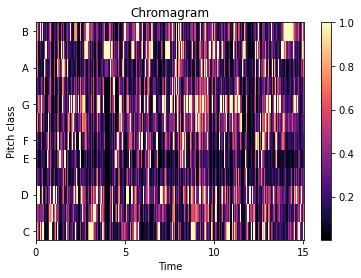

In [7]:
S = np.abs(librosa.stft(y))
chroma = librosa.feature.chroma_stft(S=S, sr=sr)
S = np.abs(librosa.stft(y, n_fft=4096))**2
chroma = librosa.feature.chroma_stft(S=S, sr=sr)
fig, ax = plt.subplots()
img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='Chromagram')
plt.show()

For our generated features, the mean and variance was taken across the entire generated array.

In [8]:
np.mean(chroma)

0.34219548

In [9]:
df["rms_mean"].describe()

count    1000.000000
mean        0.130930
std         0.065683
min         0.005276
25%         0.086657
50%         0.122443
75%         0.175682
max         0.397973
Name: rms_mean, dtype: float64

[RMS level][3] (root mean squared) is fairly simple -- it is just __proportional to the amount of energy over a period of time in the signal.__ This can be used to distinguish songs that are louder from each other.

[3]: https://en.wikipedia.org/wiki/Audio_power#Continuous_power_and_%22RMS_power%22

This RMS value is generated using numpy and is a fairly simple calculation (again, root mean squared).


In [10]:
df["spectral_centroid_mean"].describe()

count    1000.000000
mean     2201.780898
std       715.960600
min       570.040355
25%      1627.697311
50%      2209.263090
75%      2691.294667
max      4435.243901
Name: spectral_centroid_mean, dtype: float64

The [spectral centroid](https://en.wikipedia.org/wiki/Spectral_centroid) is a measure used to characterise an audio spectrum by finding its center of mass. It is also connected to the brightness of a sound, which refers to the higher mid and treble parts of the frequency.

We can use the librosa package again to compute this frequency that the energy of the spectrum centers upon.

Let's start by loading in one of our jazz songs.

In [11]:
x, sr = librosa.load('../input/gtzan-dataset-music-genre-classification/Data/genres_original/jazz/jazz.00016.wav')
ipd.Audio(x, rate=sr)

Next we will find the spectral centroids per each frame in an audio signal, compute time for visualization, and then plot.

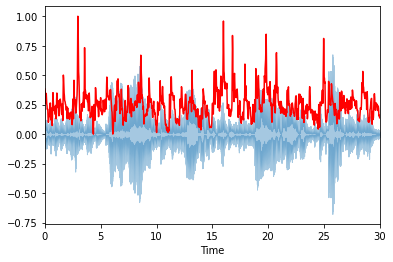

In [12]:
spectral_centroids = librosa.feature.spectral_centroid(y, sr=sr)[0]
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
def normalize(y_, axis=0):
    return sklearn.preprocessing.minmax_scale(y_, axis=axis)
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r') # normalize for visualization purposes
plt.show()


This gives us additional information about each of the songs in our data. The features are taking the mean and variance across all of this data.

[Spectral Bandwidth](https://musicinformationretrieval.com/spectral_features.html) is similar to above, just with a weighted p to provide different measures of spectral analysis.

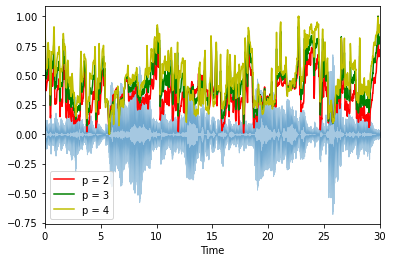

In [13]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=4)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'))
plt.show()

The other features we will not use as there are no standardized ways of computing them, so we cannot recreate them for our new songs.

Let's check for missingness.

In [14]:
df=df[['filename', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var', 'spectral_centroid_mean',
      'spectral_centroid_var', 'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'label']]
df.isnull().any()

filename                   False
chroma_stft_mean           False
chroma_stft_var            False
rms_mean                   False
rms_var                    False
spectral_centroid_mean     False
spectral_centroid_var      False
spectral_bandwidth_mean    False
spectral_bandwidth_var     False
label                      False
dtype: bool

This looks good! No missing values for any of our columns of interest.

Next let's look at some tables and graphs.

In [15]:
df.describe()

,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000
mean,0.378682,0.086340,0.130930,0.003051,2201.780898,4.696916e+05,2242.541070,137079.155165
std,0.081705,0.007735,0.065683,0.003634,715.960600,4.008995e+05,526.316473,96455.666326
min,0.171939,0.044555,0.005276,0.000004,570.040355,7.911251e+03,898.066208,10787.185064
25%,0.319562,0.082298,0.086657,0.000942,1627.697311,1.843505e+05,1907.240605,67376.554428
50%,0.383148,0.086615,0.122443,0.001816,2209.263090,3.384862e+05,2221.392843,111977.548036
75%,0.435942,0.091256,0.175682,0.003577,2691.294667,6.121479e+05,2578.469836,182371.576801
max,0.663685,0.108111,0.397973,0.027679,4435.243901,3.036843e+06,3509.646417,694784.811549


From this chart we can note a couple of things --
* Our variables are definitely all on different scales. Our max values range from 0.027 to 3,036,843, with spectral variables being the ones with high values.
* There is a lot of variation for spectral centroid and not much for chroma stft or rms.
* There doesn't seem to much skew to our data as our mean and max don't seem too far apart for any of our variables.

Let's do some visualizations.

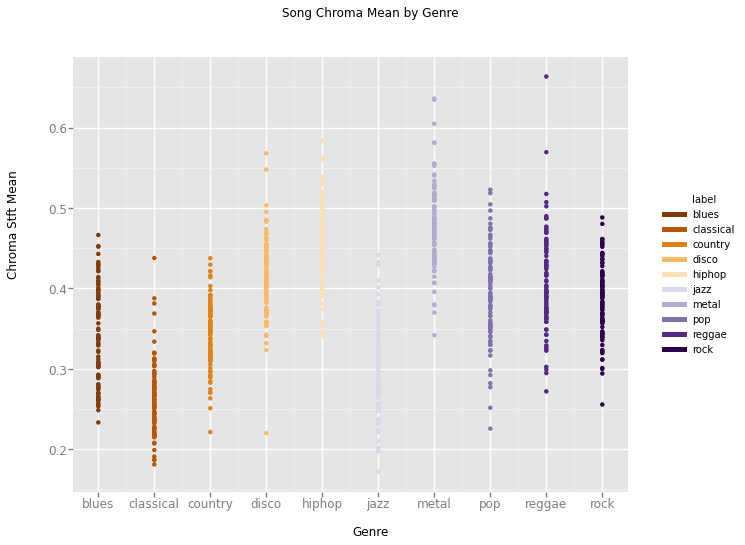

<ggplot: (8790884996229)>

In [16]:
p = ggplot(df, aes(x='label', y='chroma_stft_mean', color='label')) +\
    geom_point() +\
    scale_color_brewer(type='diverging', palette=4) +\
    xlab("Genre") + ylab("Chroma Stft Mean") + ggtitle("Song Chroma Mean by Genre")
p

So we can see there's definitely a difference across our Genres when comparing the Chroma mean. Metal has the highest while classical has the lowest.
Reggae has a few interesting outliers that go pretty far up as well. Let's look at those.

In [17]:
reggae_out=df[df['label']=='reggae']
reggae_out=reggae_out[reggae_out['chroma_stft_mean']>0.55]
reggae_out

,filename,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,label
851,reggae.00051.wav,0.569506,0.073010,0.117503,0.003290,4273.650129,2.503507e+06,2876.274873,203127.570132,reggae
886,reggae.00086.wav,0.663685,0.048071,0.351055,0.014395,4435.243901,3.036843e+06,2844.225245,487624.146015,reggae


Our offending files are 51 and 86. Let's have a listen to them.

In [18]:
x, sr = librosa.load('../input/gtzan-dataset-music-genre-classification/Data/genres_original/reggae/reggae.00051.wav')
ipd.Audio(x, rate=sr)

So.. this doesn't sound like reggae. This is a lot more electronic music. I am going to drop this out of the dataset as it seems to be mislabeled.

In [19]:
x, sr = librosa.load('../input/gtzan-dataset-music-genre-classification/Data/genres_original/reggae/reggae.00086.wav')
ipd.Audio(x, rate=sr)

I won't play this file as about 5 seconds the file glitches very loud for the rest of the recording -- no wonder it showed up so far away from our other values. I am going to remove this one as well.

In [20]:
df=df.drop(851)
df=df.drop(886)

Exploring these outliers was useful for reggae. Let's check out some others.

In [21]:
outlier=df[df['label']=='classical']
outlier=outlier[outlier['chroma_stft_mean']>0.4]
x, sr = librosa.load('../input/gtzan-dataset-music-genre-classification/Data/genres_original/classical/classical.00080.wav')
ipd.Audio(x, rate=sr)

This one just contains a lot of silence, but that is just how the song sounds. It shouldn't affect our label too much.

In [22]:
outlier=df[df['label']=='disco']
outlier=outlier[outlier['chroma_stft_mean']<0.3]
x, sr = librosa.load('../input/gtzan-dataset-music-genre-classification/Data/genres_original/disco/disco.00047.wav')
ipd.Audio(x, rate=sr)

I am not sure if that qualifies as disco -- I would call that more like a Disney song or something? I am going to remove it.

In [23]:
df=df.drop(347)

That concludes our outliers. Next let's view some graphs for the spectral centroid statistics.

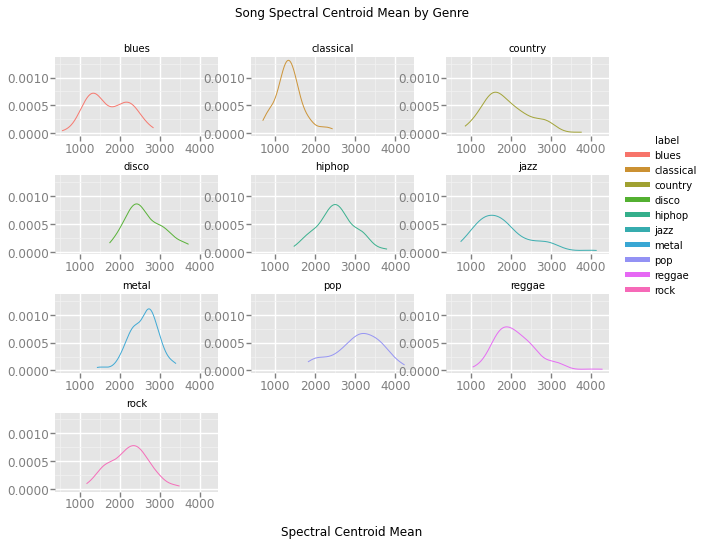

<ggplot: (8790884879153)>

In [24]:
ggplot(df, aes(x='spectral_centroid_mean', color='label')) +\
    geom_density(alpha=0.95) +\
    facet_wrap("label") +\
    xlab("Spectral Centroid Mean") + ggtitle("Song Spectral Centroid Mean by Genre")

This looks very similar to our above plot with the Chroma Mean variable as they all follow very similar distributions. Let's see if we graph a scatterplot with both as the x and y values.

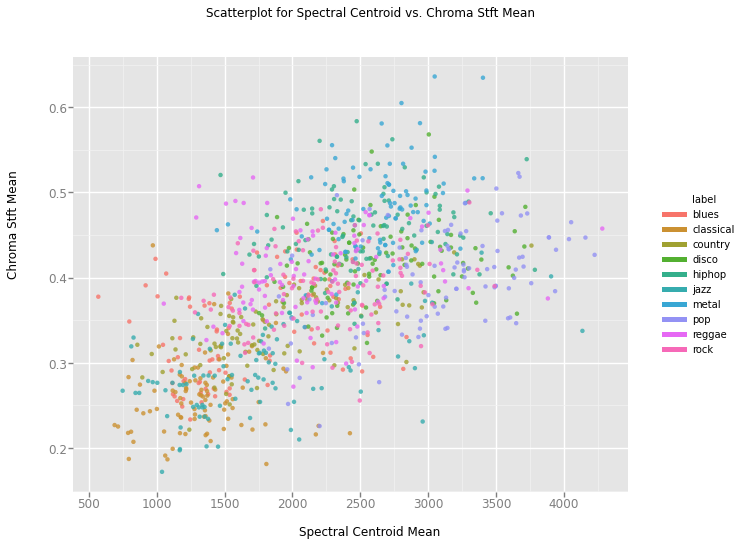

<ggplot: (8790884882229)>

In [25]:
ggplot(df, aes(x='spectral_centroid_mean', y='chroma_stft_mean', color='label')) +\
    geom_point(alpha=0.80) +\
    xlab("Spectral Centroid Mean") + ylab("Chroma Stft Mean") + ggtitle("Scatterplot for Spectral Centroid vs. Chroma Stft Mean")

So -- our values aren't as linear as I thought. There is a loosely linear correlation between the two but it is not super strong.

Speaking of correlation, let's do a heatmap to see how correlated our variables are to each other.

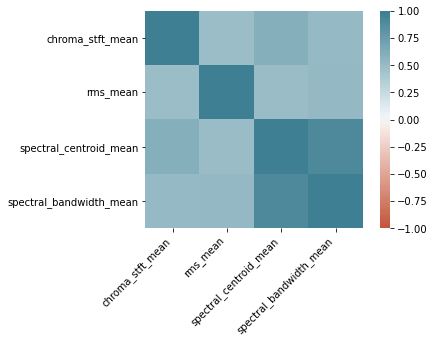

In [26]:
df_no_var=df[['filename', 'chroma_stft_mean', 'rms_mean', 'spectral_centroid_mean', 'spectral_bandwidth_mean', 'label']]
corr = df_no_var.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

To make this heatmap simpler, I only visualized the means for each of our variables.
We see all of our variables are pretty strongly correlated together, especially our two spectral centroids.
This could potentially cause problems for us in the future and it might be better to only use one of them.

For recoding variables, we could divide each category by the max of that category to get a final percent value.

In [27]:
df_no_var['chroma_stft_mean']=df_no_var['chroma_stft_mean']/df_no_var['chroma_stft_mean'].max()
df_no_var['rms_mean']=df_no_var['rms_mean']/df_no_var['rms_mean'].max()
df_no_var['spectral_centroid_mean']=df_no_var['spectral_centroid_mean']/df_no_var['spectral_centroid_mean'].max()
df_no_var['spectral_bandwidth_mean']=df_no_var['spectral_bandwidth_mean']/df_no_var['spectral_bandwidth_mean'].max()
df_no_var.describe()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

,chroma_stft_mean,rms_mean,spectral_centroid_mean,spectral_bandwidth_mean
count,997.000000,997.000000,997.000000,997.000000
mean,0.594715,0.328682,0.513292,0.638790
std,0.127233,0.164221,0.165884,0.149876
min,0.270256,0.013258,0.133122,0.255885
25%,0.502314,0.217860,0.379221,0.543433
50%,0.602177,0.308140,0.515881,0.632939
75%,0.684522,0.441385,0.628297,0.734110
max,1.000000,1.000000,1.000000,1.000000


## Dataset Source 2

Now that we have established which features are of interest to us and possible to replicate from our first dataset, we can generate them from the songs we downloaded in our second dataset. I did this offline as uploading all of the songs to Kaggle would have taken too long.

The code for that is at the bottom of the page and commented out if you are interested.

For this case, we will quickly examine the second dataset source similarly to how we did the first, looking at descriptive statistics generated in the same way as the above features and looking for outliers to see if I made any mistakes or the playlists had any mislabeled songs.

In [28]:
df2=pd.read_csv("../input/additionaldata1/additional_df.csv")
print(df2.shape)
print(df2.isnull().any())
df2.head()

(788, 6)
filename                   False
chroma_stft_mean           False
rms_mean                   False
spectral_centroid_mean     False
spectral_bandwidth_mean    False
label                      False
dtype: bool


,filename,chroma_stft_mean,rms_mean,spectral_centroid_mean,spectral_bandwidth_mean,label
0,h 10-Big Mama Thornton - Let's Go Get Stoned.wav,0.523978,0.127323,1649.591756,2481.040845,blues
1,h 101-Roscoe Holcomb - Graveyard Blues.wav,0.473332,0.157964,1206.398074,1283.610492,blues
2,h 102-Sam Lightnin' Hopkins - Cotton.wav,0.449313,0.130963,962.764709,1974.216470,blues
3,h 103-Skip James - Devil Got My Woman.wav,0.475080,0.119230,1415.668056,2380.977723,blues
4,h 104-Skip James - Hard Time Killin' Floor Blu...,0.479045,0.047462,1758.296561,2847.211463,blues


This dataset has 788 rows while our previous had 1000.

In [29]:
df2.groupby(['label']).size()

label
blues        124
classical     97
country       66
disco         85
hiphop        99
jazz          86
pop          100
reggae        61
rock          70
dtype: int64

The main difference in the two datasets is the difference in size for labels, with country only having 66 songs while blues has 124. I am aiming to continue adding songs to this dataset as the semester goes on so I will have this fixed soon.

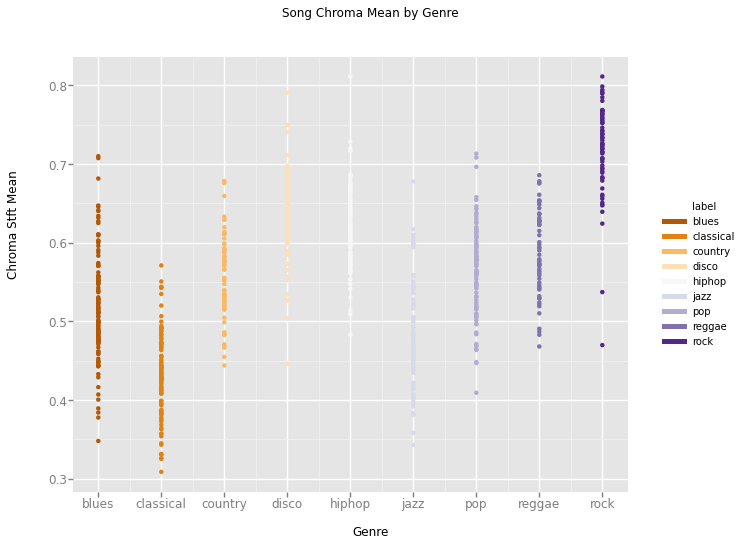

<ggplot: (8790878155321)>

In [30]:
p = ggplot(df2, aes(x='label', y='chroma_stft_mean', color='label')) +\
    geom_point() +\
    scale_color_brewer(type='diverging', palette=4) +\
    xlab("Genre") + ylab("Chroma Stft Mean") + ggtitle("Song Chroma Mean by Genre")
p

We see a surprisingly similar graph to what we saw before, with classical being the lowest and rock/metal being the highest.

In [31]:
rock=df2[df2['label']=='rock']
rock=rock[rock['chroma_stft_mean']<0.55]
rock

,filename,chroma_stft_mean,rms_mean,spectral_centroid_mean,spectral_bandwidth_mean,label
752,h 42-Metallica - The Day That Never Comes (vid...,0.537056,0.123882,1998.679589,2272.873646,rock
784,h 71-Amapola 1941 _ ORIGINAL _ Helen O'Connell...,0.469650,0.155241,1177.247780,1721.116662,rock


While that Metallica one is correct, the Helen O'Connel is one from the Jazz category and got incorrectly sorted.

In [32]:
df2=df2.drop(784)

The other outliers investigated proved to be correctly sorted.

In [33]:
df_no_var['dataset'] = "Source 1"
df2['dataset'] = "Source 2"

df2['chroma_stft_mean']=df2['chroma_stft_mean']/df2['chroma_stft_mean'].max()
df2['rms_mean']=df2['rms_mean']/df2['rms_mean'].max()
df2['spectral_centroid_mean']=df2['spectral_centroid_mean']/df2['spectral_centroid_mean'].max()
df2['spectral_bandwidth_mean']=df2['spectral_bandwidth_mean']/df2['spectral_bandwidth_mean'].max()

master_df = pd.concat([df_no_var, df2])
master_df

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,filename,chroma_stft_mean,rms_mean,spectral_centroid_mean,spectral_bandwidth_mean,label,dataset
0,blues.00000.wav,0.550272,0.327228,0.416659,0.570556,blues,Source 1
1,blues.00001.wav,0.535851,0.241091,0.357344,0.580981,blues,Source 1
2,blues.00002.wav,0.571568,0.441161,0.362630,0.497971,blues,Source 1
3,blues.00003.wav,0.636244,0.354529,0.249904,0.454864,blues,Source 1
4,blues.00004.wav,0.484944,0.229987,0.428531,0.498105,blues,Source 1
...,...,...,...,...,...,...,...
782,h 7-Avenged Sevenfold - Beast And The Harlot (...,0.899779,0.308194,0.782151,0.864895,rock,Source 2
783,h 70-All That Remains - Two Weeks (Official Mu...,0.973736,0.291044,0.731712,0.803865,rock,Source 2
785,h 72-ARCH ENEMY - Nemesis (OFFICIAL VIDEO).wav,0.961825,0.374512,0.701771,0.798589,rock,Source 2
786,h 8-Bullet For My Valentine - Tears Don't Fall...,0.856133,0.390312,0.789374,0.858561,rock,Source 2


One last thing I wanted to examine is how these two Data sources compare side by side using a density plot.

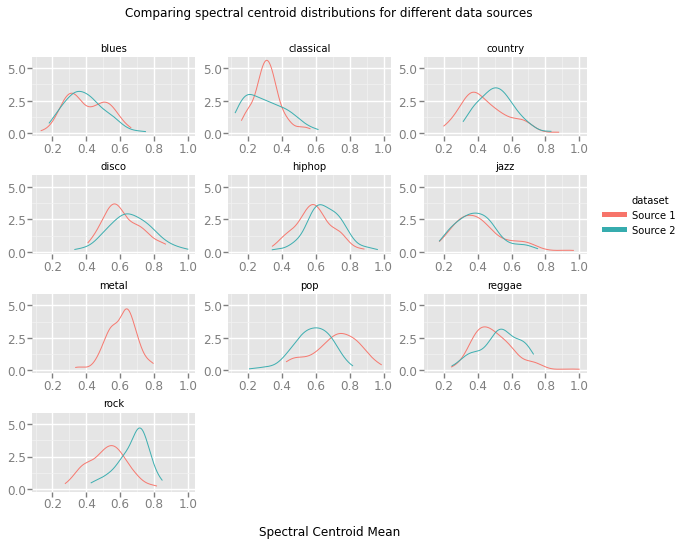

<ggplot: (8790884976705)>

In [34]:
ggplot(master_df, aes(x='spectral_centroid_mean', color='dataset')) +\
    geom_density(alpha=0.95) +\
    facet_wrap("label") +\
    xlab("Spectral Centroid Mean") + ggtitle("Comparing spectral centroid distributions for different data sources")

We see here that majority of our genres follow a very similar distribution, with the main differences being in pop and rock -- most likely because the Youtube playlists I downloaded for these genres were majority songs from 2020.
In order to fix this, I'll add in other playlists that are from older songs to more fit the curve from the older dataset. 

I also was unable to find any good Metal playlists as most of them were just the same songs in the rock playlist, so this is something I need to go back to and really search for.

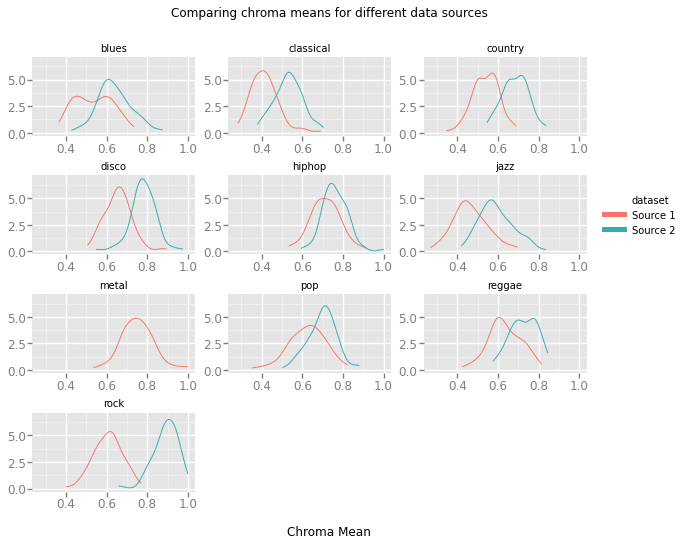

<ggplot: (8790877962889)>

In [35]:
ggplot(master_df, aes(x='chroma_stft_mean', color='dataset')) +\
    geom_density(alpha=0.95) +\
    facet_wrap("label") +\
    xlab("Chroma Mean") + ggtitle("Comparing chroma means for different data sources")

Our differences are just exacerbated here, as for almost every category they are higher up on the chroma mean scale. Possibly the quality from Youtube is better than the quality from the GTZAN dataset, as those songs were all pulled from old personal CDs, radio, microphone recordings.

# Concluding Thoughts

* We have successfully identified our variables of interest for our data through research and exploration of our features.
* We cleaned our data by picking out outliers and mislabeled values through using visualizations as well normalizing our features.
* We encorporated our own data and merged the two dataframes together and compared the differences between them.


Moving forward, this should set the base for a good baseline model to compare against a pre-trained neural network and to potentially merge together.

# Offline Audio Feature Extraction

In [36]:
# import pandas as pd
# import numpy as np
# import librosa
# import os
# import math

# list_=[]

# for dirname, _, filenames in os.walk('E:/code/470w30'):
#     for filename in filenames:
        
#         path_=(os.path.join(dirname, filename))
#         label=(dirname.split('\\')[1])
#         y, sr = librosa.load(path_)
#         S = np.abs(librosa.stft(y))
#         chroma = librosa.feature.chroma_stft(S=S, sr=sr)
#         chroma_mean = (np.mean(chroma))
        
#         rms=math.sqrt(np.mean(y*y))
        
#         spectral_centroids = librosa.feature.spectral_centroid(y, sr=sr)[0]
#         spectral_mean = (np.mean(spectral_centroids))
        
#         spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(y+0.01, sr=sr)[0]
#         spectral_bandwidth_2 = np.mean(spectral_bandwidth_2)
#         spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(y+0.01, sr=sr, p=3)[0]
#         spectral_bandwidth_3 = np.mean(spectral_bandwidth_3)
#         spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(y+0.01, sr=sr, p=4)[0]
#         spectral_bandwidth_4 = np.mean(spectral_bandwidth_4)
#         band_mean = np.mean(np.array([spectral_bandwidth_2, spectral_bandwidth_3, spectral_bandwidth_4]))
        
#         list_.append([filename, chroma_mean, rms, spectral_mean, band_mean, label])
        
# df_=pd.DataFrame(list_, columns=['filename', 'chroma_stft_mean', 'rms_mean', 'spectral_centroid_mean', 'spectral_bandwidth_mean', 'label'])

# df_.to_csv("additional_df.csv", index=False)